#Animal Adoption Analysis

1. Load and preprocess data  
2. Create analytical tables  
3. Make visualizations in Python  
4. Train and evaluate a baseline logistic regression classifier
5. Train and evaluate a baseline MLP classifier
6. Test classifiers on created examples using LIME

## 1. Load and preprocess data

We use pandas and numpy for cleaning and feature creation.
We keep only cats and dogs, calculate age and shelter stay, and create the binary label adopted.

In [2]:
import pandas as pd
import numpy as np

df = pd.read_csv("Austin_Animal_Center_Outcomes_20260415.csv")

# Normalize column names to snake_case for consistent attribute access
df.columns = (
    df.columns.str.strip()
    .str.lower()
    .str.replace(" ", "_")
    .str.replace("/", "_")
    .str.replace(".", "_", regex=False)
)

df["outcome_date"] = pd.to_datetime(df["outcome_date"], errors="coerce")
df["intake_date"] = pd.to_datetime(df["intake_date"], errors="coerce", format="%Y %b %d %I:%M:%S %p")
df["date_of_birth"] = pd.to_datetime(df["date_of_birth"], errors="coerce", format="%Y %b %d %I:%M:%S %p")
df["timestamp"] = pd.to_datetime(df["timestamp"], errors="coerce", format="%Y %b %d %I:%M:%S %p")

# Each animal (id) can appear multiple times as its record is updated, keep only the latest snapshot
df = df.sort_values(["id", "timestamp"]).drop_duplicates(subset="id", keep="last").copy()

# Juveniles are biologically the same species, merge them with their adult labels
df["type"] = df["type"].replace({"Puppy": "Dog", "Kitten": "Cat"})
df = df[df["type"].isin(["Dog", "Cat"])].copy()

for col in ["sex", "spayed_neutered", "primary_breed", "primary_color", "secondary_color", "outcome_status"]:
    df[col] = df[col].astype("string").str.strip()

df["sex"] = df["sex"].fillna("Unknown")
df["spayed_neutered"] = df["spayed_neutered"].fillna("Unknown")
df["primary_breed"] = df["primary_breed"].fillna("Unknown")
df["primary_color"] = df["primary_color"].fillna("Unknown")
df["secondary_color"] = df["secondary_color"].fillna("")
df["outcome_status"] = df["outcome_status"].fillna("Unknown")

# Build a single color string, skip the slash when no secondary color exists
df["full_color"] = np.where(
    df["secondary_color"].eq("") | df["secondary_color"].isna(),
    df["primary_color"],
    df["primary_color"] + "/" + df["secondary_color"]
)

df["stay_days"] = (df["outcome_date"] - df["intake_date"]).dt.total_seconds() / (60 * 60 * 24)
df["age_at_intake_years"] = (df["intake_date"] - df["date_of_birth"]).dt.total_seconds() / (60 * 60 * 24 * 365.25)
df["age_at_outcome_years"] = (df["outcome_date"] - df["date_of_birth"]).dt.total_seconds() / (60 * 60 * 24 * 365.25)

# Negative durations signal bad/missing date entries, treat as missing rather than as incorrect values
for col in ["stay_days", "age_at_intake_years", "age_at_outcome_years"]:
    df.loc[df[col] < 0, col] = np.nan

df["adopted"] = df["outcome_status"].str.startswith("Adopted", na=False).astype(int)
df["age_group"] = pd.cut(
    df["age_at_intake_years"],
    bins=[-np.inf, 1, 3, 7, np.inf],
    labels=["Under 1 year", "1-3 years", "3-7 years", "7+ years"]
)

df.head()

,id,outcome_date,animal_id,name,outcome_status,euthanasia_reason,type,sex,spayed_neutered,primary_breed,...,date_of_birth,intake_date,days_in_shelter,timestamp,full_color,stay_days,age_at_intake_years,age_at_outcome_years,adopted,age_group
10449,12891,2025-05-05 10:08:00,6881,Honeysuckle,Euthanized,Injured,Cat,Female,Unknown,Himalayan,...,2020-05-05,2025-05-05 09:55:00,320,2026-03-21 19:01:18,Cream/Brown,0.009028,5.000447,5.000472,0,3-7 years
10450,12912,2025-05-05 11:22:00,5994,NaN,Unresolved File,NaN,Cat,Male,No,Domestic Shorthair,...,2023-04-20,2023-05-03 00:00:00,"1,053",2026-03-21 19:01:18,Black,733.473611,0.035592,2.043733,0,Under 1 year
10942,13008,2025-05-20 13:46:00,6035,NaN,Transfer Out,NaN,Cat,Male,No,Domestic Shorthair,...,2024-05-04,2024-05-13 00:00:00,677,2026-03-21 19:01:16,Blue,372.573611,0.024641,1.044692,0,Under 1 year
10452,13052,2025-05-05 18:53:00,5970,OLLI,Adopted,NaN,Cat,Female,Yes,Domestic Shorthair,...,2014-04-20,2025-05-02 00:00:00,323,2026-03-21 19:01:18,Orange Tabby,3.786806,11.033539,11.043906,1,7+ years
10451,13060,2025-05-05 17:15:00,6885,NaN,Transfer Out,NaN,Dog,Female,No,German Shepherd,...,2025-01-05,2025-05-05 10:40:00,320,2026-03-21 19:01:18,Buff/Cream,0.274306,0.329759,0.330510,0,Under 1 year


## 2. Analytical tables

We create simple summary tables for important variables like total count, breed, and age group to visualize the general breakdown of different metrics.

In [3]:
type_summary = (
    df.groupby("type")
    .agg(
        n=("id", "count"),
        adopted_n=("adopted", "sum"),
        adoption_rate=("adopted", "mean"),
        mean_age_at_intake=("age_at_intake_years", "mean"),
        mean_age_at_outcome=("age_at_outcome_years", "mean"),
        mean_stay_days=("stay_days", "mean"),
    )
    .reset_index()
)

type_summary

,type,n,adopted_n,adoption_rate,mean_age_at_intake,mean_age_at_outcome,mean_stay_days
0,Cat,6265,3627,0.578931,1.261558,1.326027,25.234744
1,Dog,4532,2422,0.534422,2.257336,2.367602,42.400070


In [4]:
top_breeds = (
    df.groupby(["type", "primary_breed"])
    .size()
    .reset_index(name="count")
    .sort_values(["type", "count"], ascending=[True, False])
)

top_breeds.groupby("type").head(10)

,type,primary_breed,count
6,Cat,Domestic Shorthair,5493
5,Cat,Domestic Medium Hair,462
4,Cat,Domestic Long Hair,139
14,Cat,Siamese,101
12,Cat,Russian,20
1,Cat,American Shorthair,12
9,Cat,Persian,8
16,Cat,Sphynx,7
8,Cat,Maine Coon,6
10,Cat,RUSSIAN BLUE,4


In [5]:
adoption_by_age_group = (
    df.dropna(subset=["age_group"])
    .groupby(["type", "age_group"], observed=False) # observed=False ensures age groups with zero animals still appear
    .agg(
        n=("id", "count"),
        adoption_rate=("adopted", "mean")
    )
    .reset_index()
)

adoption_by_age_group

,type,age_group,n,adoption_rate
0,Cat,Under 1 year,3898,0.675988
1,Cat,1-3 years,1337,0.451758
2,Cat,3-7 years,527,0.506641
3,Cat,7+ years,219,0.415525
4,Dog,Under 1 year,1922,0.610302
5,Dog,1-3 years,1251,0.552358
6,Dog,3-7 years,825,0.493333
7,Dog,7+ years,373,0.386059


## 3. Graphs in Python

We use matplotlib to create basic visualizations analyzing the relationships between different intake variables like species, breed, age, and spayed/neutered status. This can help us get a better idea of the dataset before continuing to the model training.

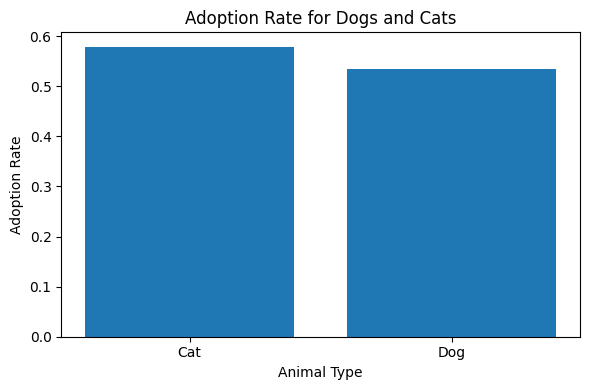

In [6]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 4))
plt.bar(type_summary["type"], type_summary["adoption_rate"])
plt.title("Adoption Rate for Dogs and Cats")
plt.xlabel("Animal Type")
plt.ylabel("Adoption Rate")
plt.tight_layout()
plt.show()

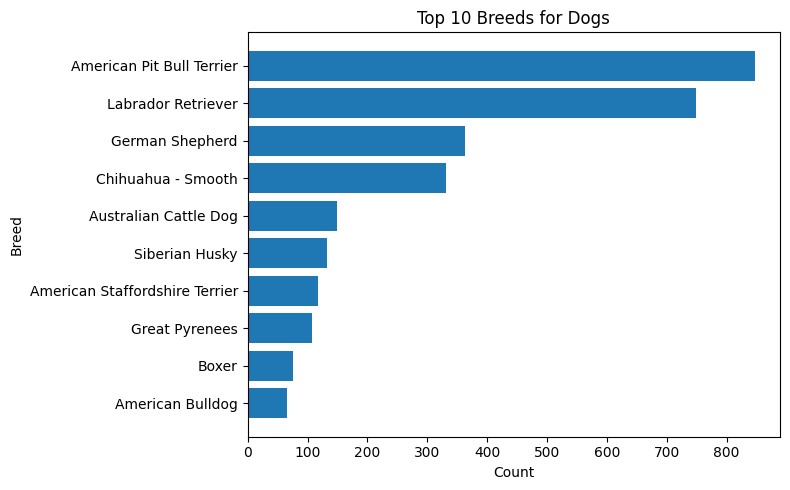

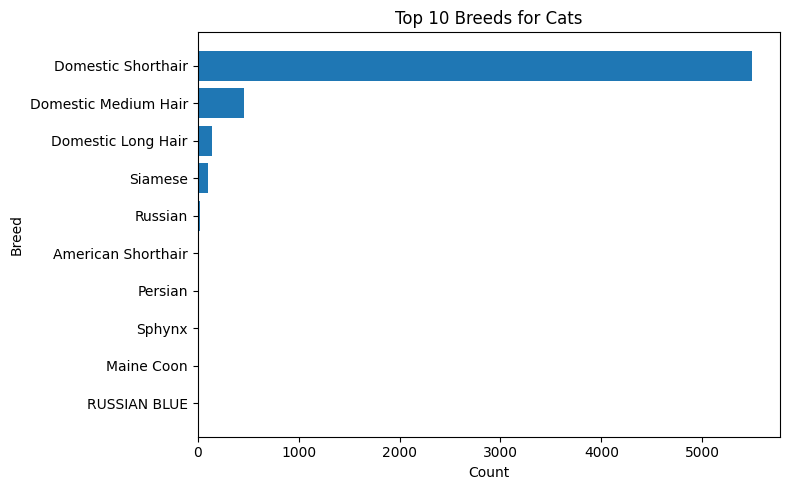

In [7]:
for animal_type in ["Dog", "Cat"]:
    sub = top_breeds[top_breeds["type"] == animal_type].head(10).sort_values("count")
    plt.figure(figsize=(8, 5))
    plt.barh(sub["primary_breed"], sub["count"])
    plt.title(f"Top 10 Breeds for {animal_type}s")
    plt.xlabel("Count")
    plt.ylabel("Breed")
    plt.tight_layout()
    plt.show()

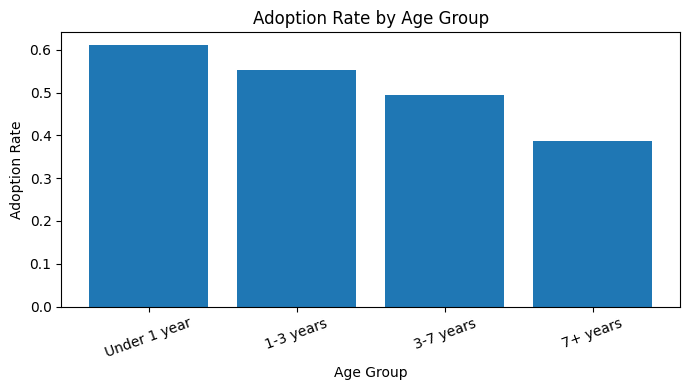

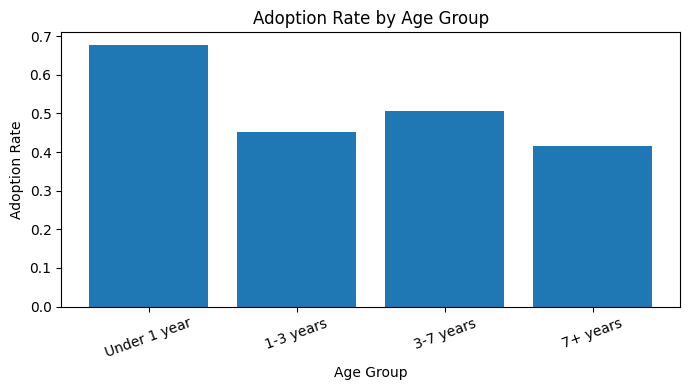

In [8]:
for animal_type in ["Dog", "Cat"]:
    sub = adoption_by_age_group[adoption_by_age_group["type"] == animal_type]
    plt.figure(figsize=(7, 4))
    plt.bar(sub["age_group"].astype(str), sub["adoption_rate"])
    plt.title(f"Adoption Rate by Age Group")
    plt.xlabel("Age Group")
    plt.ylabel("Adoption Rate")
    plt.xticks(rotation=20)
    plt.tight_layout()
    plt.show()

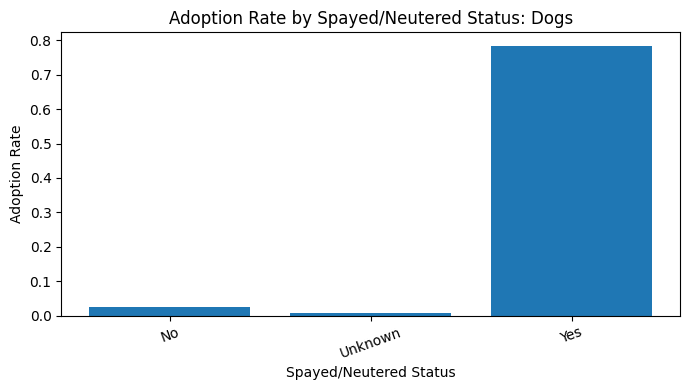

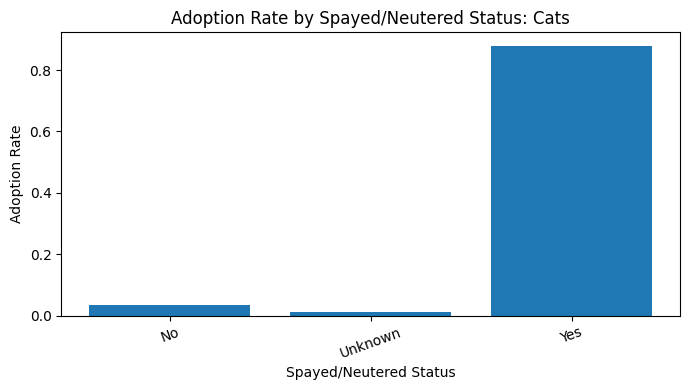

In [9]:
# Re-normalize case before grouping since raw data has mixed casing (e.g. "yes"/"Yes") from inconsistent data entry
df["spayed_neutered"] = (
    df["spayed_neutered"]
    .astype(str)
    .str.strip()
    .str.lower()
    .replace({
        "yes": "Yes",
        "no": "No",
        "unknown": "Unknown",
        "nan": "Unknown"
    })
)
adoption_by_fix_status = (
    df.groupby(["type", "spayed_neutered"])
      .agg(
          n=("id", "count"),
          adoption_rate=("adopted", "mean")
      )
      .reset_index()
)

adoption_by_fix_status
for animal_type in ["Dog", "Cat"]:
    sub = adoption_by_fix_status[adoption_by_fix_status["type"] == animal_type]

    plt.figure(figsize=(7, 4))
    plt.bar(sub["spayed_neutered"].astype(str), sub["adoption_rate"])
    plt.title(f"Adoption Rate by Spayed/Neutered Status: {animal_type}s")
    plt.xlabel("Spayed/Neutered Status")
    plt.ylabel("Adoption Rate")
    plt.xticks(rotation=20)
    plt.tight_layout()
    plt.show()

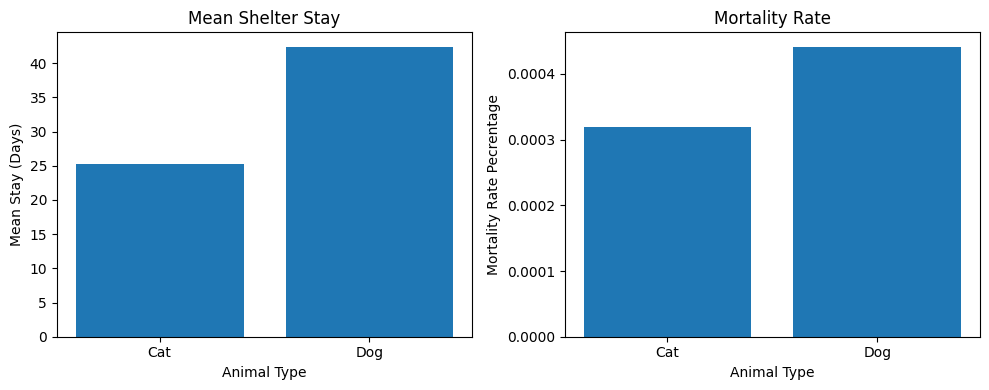

In [10]:
# Mortality = animals that died or were euthanized

df["mortality"] = np.where(
    df["outcome_status"].fillna("").str.startswith("Euthanasia") |
    df["outcome_status"].fillna("").str.startswith("Died"),
    1,
    0
)

stay_mortality_summary = (
    df.groupby("type")
      .agg(
          mean_stay_days=("stay_days", "mean"),
          mortality_rate=("mortality", "mean")
      )
      .reset_index()
)

stay_mortality_summary

fig, axes = plt.subplots(1, 2, figsize=(10, 4))

axes[0].bar(stay_mortality_summary["type"], stay_mortality_summary["mean_stay_days"])
axes[0].set_title("Mean Shelter Stay")
axes[0].set_xlabel("Animal Type")
axes[0].set_ylabel("Mean Stay (Days)")

axes[1].bar(stay_mortality_summary["type"], stay_mortality_summary["mortality_rate"])
axes[1].set_title("Mortality Rate")
axes[1].set_xlabel("Animal Type")
axes[1].set_ylabel("Mortality Rate Pecrentage")

plt.tight_layout()
plt.show()

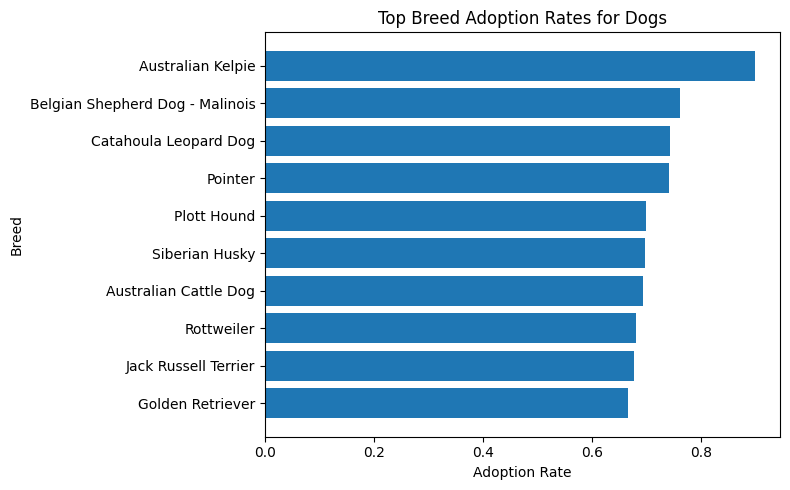

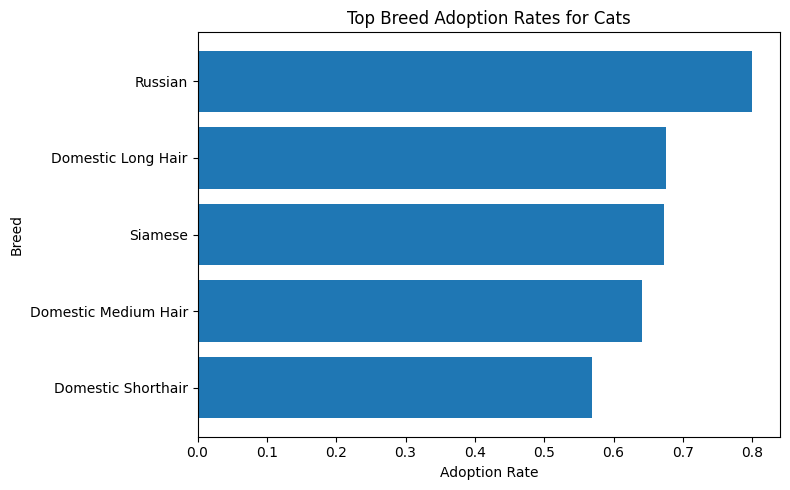

In [11]:
breed_adoption = (
    df.groupby(["type", "primary_breed"])
      .agg(
          n=("id", "count"),
          adoption_rate=("adopted", "mean")
      )
      .reset_index()
)

for animal_type in ["Dog", "Cat"]:
    sub = (
        breed_adoption[breed_adoption["type"] == animal_type]
        .query("n >= 20") # Require at least 20 animals per breed for a statistically reliable adoption rate
        .sort_values("adoption_rate", ascending=False)
        .head(10)
        .sort_values("adoption_rate")
    )

    plt.figure(figsize=(8, 5))
    plt.barh(sub["primary_breed"], sub["adoption_rate"])
    plt.title(f"Top Breed Adoption Rates for {animal_type}s")
    plt.xlabel("Adoption Rate")
    plt.ylabel("Breed")
    plt.tight_layout()
    plt.show()

## 4. Train a baseline logistic regression classifier

Logistic regression is a standard and interpretable baseline model for binary classification, which will work well for our binary adoption variable.

In [12]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

breed_counts = df["primary_breed"].value_counts()
color_counts = df["full_color"].value_counts()

# Collapse rare breeds/colors into "Other" to prevent the model from overfitting to sparse categories
df["breed_grouped"] = df["primary_breed"].where(df["primary_breed"].map(breed_counts) >= 25, "Other Breed")
df["color_grouped"] = df["full_color"].where(df["full_color"].map(color_counts) >= 20, "Other Color")

model_df = df[
    ["adopted", "type", "sex", "spayed_neutered", "breed_grouped", "color_grouped", "age_at_intake_years"]
].dropna().copy()

X = model_df[["type", "sex", "spayed_neutered", "breed_grouped", "color_grouped", "age_at_intake_years"]]
y = model_df["adopted"]

cat_cols = ["type", "sex", "spayed_neutered", "breed_grouped", "color_grouped"]
num_cols = ["age_at_intake_years"]

preprocess = ColumnTransformer(
    transformers=[
        # handle_unknown="ignore" silently drops unseen categories at prediction time instead of raising an error
        ("cat", OneHotEncoder(handle_unknown="ignore"), cat_cols),
        ("num", StandardScaler(), num_cols),
    ]
)

model = Pipeline(
    steps=[
        ("preprocess", preprocess),
        ("classifier", LogisticRegression(max_iter=1000, random_state=0)),
    ]
)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=0, stratify=y # stratify=y preserves the adopted/not-adopted class ratio in both train and test splits
)

model.fit(X_train, y_train)
y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")
print(classification_report(y_test, y_pred))

Accuracy: 0.8797682279092226
Precision: 0.8549107142857143
Recall: 0.9551122194513716
F1 Score: 0.9022379269729093
              precision    recall  f1-score   support

           0       0.93      0.78      0.84       868
           1       0.85      0.96      0.90      1203

    accuracy                           0.88      2071
   macro avg       0.89      0.87      0.87      2071
weighted avg       0.88      0.88      0.88      2071



## 5. Train a baseline MLP classifier and compare

This gives us the opportunity to test a different model and see which one works better. Since MLP classification is versatile and more suitable to non-linear relationships than logistic regression, MLP might find relationships that logistic regression could miss.

In [13]:
from sklearn.neural_network import MLPClassifier

mlp_model = Pipeline(
    steps=[
        ("preprocess", preprocess),
        ("classifier", MLPClassifier(max_iter=1000, random_state=0)),
    ]
)

mlp_model.fit(X_train, y_train)
y_pred_mlp = mlp_model.predict(X_test)

accuracy_mlp = accuracy_score(y_test, y_pred_mlp)
precision_mlp = precision_score(y_test, y_pred_mlp)
recall_mlp = recall_score(y_test, y_pred_mlp)
f1_mlp = f1_score(y_test, y_pred_mlp)

print(f"Accuracy: {accuracy_mlp}")
print(f"Precision: {precision_mlp}")
print(f"Recall: {recall_mlp}")
print(f"F1 Score: {f1_mlp}")

print("\nClassification Report (per class):")
print(classification_report(y_test, y_pred_mlp))

Accuracy: 0.8565910188314824
Precision: 0.8566929133858268
Recall: 0.9044056525353283
F1 Score: 0.8799029518803073

Classification Report (per class):
              precision    recall  f1-score   support

           0       0.86      0.79      0.82       868
           1       0.86      0.90      0.88      1203

    accuracy                           0.86      2071
   macro avg       0.86      0.85      0.85      2071
weighted avg       0.86      0.86      0.86      2071



##6. Test both models on created examples using LIME

LIME can be used for local interpretation of individual predictions, which, in addition to the classification metrics, can help us evaluate the models by understanding which features can push a single example toward being adopted or not adopted.

In [14]:
!pip install lime
import lime
from lime import lime_tabular

# Re-run fit_transform directly on the preprocessor to extract its feature names.
# The pipeline already fitted this during model.fit(), but LIME needs the raw transformed array
# and feature name list independently because it cannot pull them through the Pipeline object.
X_train_processed = preprocess.fit_transform(X_train)

feature_names = preprocess.named_transformers_['cat'].get_feature_names_out(cat_cols)

# Combine one-hot encoded feature names with numerical feature names
all_lime_feature_names = list(feature_names) + num_cols

# Initialize LimeTabularExplainer with the numerically preprocessed data
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train_processed,
    feature_names=all_lime_feature_names,
    class_names=[0, 1],
    mode='classification'
)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 16.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=fcd44ebddc2b253f52886275371ebf08f308750d83a6341593a7bc93f32f0197
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


In [15]:
example_entry_data = {
    'type': ['Cat'],
    'sex': ['Female'],
    'spayed_neutered': ['Yes'],
    'breed_grouped': ['Domestic Shorthair'],
    'color_grouped': ['Black'],
    'age_at_intake_years': [2.0]
}
example_entry_df = pd.DataFrame(example_entry_data)

# Preprocess the example entry using the same pipeline used for training data
example_entry_processed = preprocess.transform(example_entry_df)

# Prints the percentage of adoption likeliness
adoption_probability = model.predict_proba(example_entry_df)[0][1]
print(f"Based on the logistic regression classifier, this animal has a {adoption_probability:.1%} predicted chance of being adopted.")

exp = explainer.explain_instance(
    data_row=example_entry_processed[0], # Pass the first (and only) row of the processed data
    predict_fn=model.named_steps['classifier'].predict_proba # Use only the classifier's predict_proba
)

exp.show_in_notebook(show_table=True)

Based on the logistic regression classifier, this animal has a 86.0% predicted chance of being adopted.


In [16]:
# MLP prediction for the same example, compare with the logistic regression result above
adoption_probability = mlp_model.predict_proba(example_entry_df)[0][1]
print(f"Based on the MLP classifier, this animal has a {adoption_probability:.1%} predicted chance of being adopted.")

exp = explainer.explain_instance(
    data_row=example_entry_processed[0], # Pass the first (and only) row of the processed data
    predict_fn=mlp_model.named_steps['classifier'].predict_proba # Use only the classifier's predict_proba
)

exp.show_in_notebook(show_table=True)

Based on the MLP classifier, this animal has a 79.7% predicted chance of being adopted.


In [17]:
example_entry_data = {
    'type': ['Dog'],
    'sex': ['Male'],
    'spayed_neutered': ['No'],
    'breed_grouped': ['Chihuahua - Long-hair'],
    'color_grouped': ['White/Cream'],
    'age_at_intake_years': [14.6]
}
example_entry_df = pd.DataFrame(example_entry_data)

# Preprocess the example entry using the same pipeline used for training data
example_entry_processed = preprocess.transform(example_entry_df)

# Prints the percentage of adoption likeliness
adoption_probability = model.predict_proba(example_entry_df)[0][1]
print(f"Based on the logistic regression clasifier, this animal has a {adoption_probability:.1%} predicted chance of being adopted.")

exp = explainer.explain_instance(
    data_row=example_entry_processed[0], # Pass the first (and only) row of the processed data
    predict_fn=model.named_steps['classifier'].predict_proba # Use only the classifier's predict_proba
)

exp.show_in_notebook(show_table=True)

Based on the logistic regression clasifier, this animal has a 0.1% predicted chance of being adopted.


In [18]:
# MLP prediction for the same example, compare with the logistic regression result above
adoption_probability = mlp_model.predict_proba(example_entry_df)[0][1]
print(f"Based on the MLP classifier, this animal has a {adoption_probability:.1%} predicted chance of being adopted.")

exp = explainer.explain_instance(
    data_row=example_entry_processed[0], # Pass the first (and only) row of the processed data
    predict_fn=mlp_model.named_steps['classifier'].predict_proba # Use only the classifier's predict_proba
)

exp.show_in_notebook(show_table=True)

Based on the MLP classifier, this animal has a 14.2% predicted chance of being adopted.


In [19]:
example_entry_data = {
    'type': ['Dog'],
    'sex': ['Female'],
    'spayed_neutered': ['Yes'],
    'breed_grouped': ['American Pit Bull Terrier'],
    'color_grouped': ['Brown Tabby'],
    'age_at_intake_years': [6.2]
}
example_entry_df = pd.DataFrame(example_entry_data)

# Preprocess the example entry using the same pipeline used for training data
example_entry_processed = preprocess.transform(example_entry_df)

# Prints the percentage of adoption likeliness
adoption_probability = model.predict_proba(example_entry_df)[0][1]
print(f"Based on the logistic regression classifier, this animal has a {adoption_probability:.1%} predicted chance of being adopted.")

exp = explainer.explain_instance(
    data_row=example_entry_processed[0], # Pass the first (and only) row of the processed data
    predict_fn=model.named_steps['classifier'].predict_proba # Use only the classifier's predict_proba
)

exp.show_in_notebook(show_table=True)

Based on the logistic regression classifier, this animal has a 61.9% predicted chance of being adopted.


In [20]:
# MLP prediction for the same example, compare with the logistic regression result above
adoption_probability = mlp_model.predict_proba(example_entry_df)[0][1]
print(f"Based on the MLP classifier, this animal has a {adoption_probability:.1%} predicted chance of being adopted.")

exp = explainer.explain_instance(
    data_row=example_entry_processed[0], # Pass the first (and only) row of the processed data
    predict_fn=mlp_model.named_steps['classifier'].predict_proba # Use only the classifier's predict_proba
)

exp.show_in_notebook(show_table=True)

Based on the MLP classifier, this animal has a 35.3% predicted chance of being adopted.


# **Demo below here!**
## Characteristics: Cat, male, neutered (yes), Sphnyx, Unknown, 20

In [21]:
example_entry_data = {
    'type': ['Cat'],
    'sex': ['Male'],
    'spayed_neutered': ['Yes'],
    'breed_grouped': ['Sphnyx'],
    'color_grouped': ['Unknown'],
    'age_at_intake_years': [20]
}
example_entry_df = pd.DataFrame(example_entry_data)

# Preprocess the example entry using the same pipeline used for training data
example_entry_processed = preprocess.transform(example_entry_df)

# Prints the percentage of adoption likeliness
adoption_probability = model.predict_proba(example_entry_df)[0][1]
print(f"This animal has a {adoption_probability:.1%} predicted chance of being adopted.")

exp = explainer.explain_instance(
    data_row=example_entry_processed[0],
    predict_fn=model.named_steps['classifier'].predict_proba # Use only the classifier's predict_proba
)

exp.show_in_notebook(show_table=True)

This animal has a 5.1% predicted chance of being adopted.
